##  <center> Face recognition and verification with Keras </center>
<b>Date</b>: 06/01/2019 <br>
<b>Project goal</b>: to build a system that can recognize human faces in a picture or video, then identify who they are based on labeled person's picture <br>
<b>Tools</b>: OpenCV, Keras, Keras VGG Face Net. <br>
<b>Skills</b>: Convolutional neural network, face identification using cosine similarity, image processing. <br>

### 1: Import libraries

In [9]:
import numpy as np
import cv2
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
import random
from PIL import Image as PImage
%matplotlib inline

from tensorflow.keras.layers import Dense, Input, Dropout,Flatten, Convolution2D, ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization, Activation, MaxPooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from keras.models import model_from_json
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import keras.backend as K

import tensorflow as tf
print("Tensorflow version:", tf.__version__)

Tensorflow version: 1.15.0


### 2: Crop person faces from pictures
OpenCV faces detection feature is used to identify and crop human faces from input picture, then save them to labeled folder. These images are used to faces verification purpose. <br>
The following people's faces are collected: Quan (myself), my friends Alviss and Steve, President Trump. Pictures including the faces are pre-downloaded and placed in the folder named after that person.<br>

In [13]:
facec = cv2.CascadeClassifier('haarcascade_frontalface_default.xml') #Load OpenCV pre-trained face detectiong weights
def crop_faces(name):
    count = 0
    for file in os.listdir('img/' + name): #List files in pre-downloaded person pictures (images) folder
        current_image = cv2.imread('img/' + name + '/' + file, cv2.COLOR_BGR2RGB) #Read image
        faces = facec.detectMultiScale(current_image, 1.3, 5) #Detect faces
        for (x, y, w, h) in faces:
            count += 1
            face = current_image[y:y+h, x:x+w] #Crop face
            face_resized = cv2.resize(face, (224, 224)) #Resize image
            cv2.imwrite('face_db/' + str(name) + '/' + str(name) + str(count) + '.jpg', face_resized) #Save to person faces folder

crop_faces('Trump')
crop_faces('Quan')
crop_faces('Alviss')
crop_faces('Steve')

Displaying face sample images

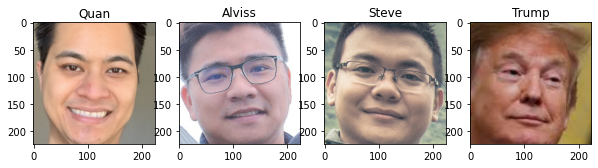

In [11]:
fig=plt.figure(figsize=(10,10))
quan = cv2.imread('face_db/Quan/Quan4.jpg')
quan = cv2.cvtColor(quan, cv2.COLOR_BGR2RGB)
fig.add_subplot(1,4,1).set_title('Quan')
plt.imshow(quan)

alviss = cv2.imread('face_db/Alviss/Alviss18.jpg')
alviss = cv2.cvtColor(alviss, cv2.COLOR_BGR2RGB)
fig.add_subplot(1,4,2).set_title('Alviss')
plt.imshow(alviss)

steve = cv2.imread('face_db/Steve/Steve19.jpg')
steve = cv2.cvtColor(steve, cv2.COLOR_BGR2RGB)
fig.add_subplot(1,4,3).set_title('Steve')
plt.imshow(steve)

trump = cv2.imread('face_db/Trump/Trump8.jpg')
trump = cv2.cvtColor(trump, cv2.COLOR_BGR2RGB)
fig.add_subplot(1,4,4).set_title('Trump')
plt.imshow(trump)

### 3: Load VGG Face model and weights
VGG Face model is a pretrained face recognition neural network. I am using to ultilize its ability to verify a person's faces for this project. Details of the model can be found [here](https://keras.io/api/applications/vgg/#vgg16-function)

In [12]:
model = Sequential()
model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(Convolution2D(4096, (7, 7), activation='relu'))
model.add(Dropout(0.5))
model.add(Convolution2D(4096, (1, 1), activation='relu'))
model.add(Dropout(0.5))
model.add(Convolution2D(2622, (1, 1)))
model.add(Flatten())
model.add(Activation('softmax'))

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [14]:
model.load_weights('VGG_model_test_weights.h5')

The output of the last layer of VGG Face model is used to classify people. In this project, we do not need that output, but we need the encoded data of the an image (a vector). The vector is the output of the flatten layer before the 'Softmax' Activation error. The below code is simply a copy of VGG Face model without the last activation layer

In [16]:
face_to_vector = Model(inputs = model.layers[0].input, outputs = model.layers[-2].output)

### 4: Create helper functions

Preprocess_img and preprocess_img_from_opencv are used to convert input images into numpy array with proper shape and scaled data, to be ready to pass into our face_to_vector model.

In [17]:
def preprocess_img(path):
    img = image.load_img(path, target_size=(224,224))
    img = image.img_to_array(img) #Convert to numpy array
    img = np.expand_dims(img, axis = 0) #Change array shape from 3 dimension (224, 224, 3) to (1, 224, 224, 3)
    img = preprocess_input(img) #Scale array data
    return img
def preprocess_img_from_opencv(img):
    img = image.img_to_array(img)  #Convert to numpy array
    img = np.expand_dims(img, axis = 0)  #Change array shape from 3 dimension (224, 224, 3) to (1, 224, 224, 3)
    img = preprocess_input(img) #Scale array data
    return img

FindCosineSimilarity is used to compare the similarity of two vectors, which means the similarity of two people in our project

In [18]:
def findCosineSimilarity(source_representation, test_representation):
    a = np.matmul(np.transpose(source_representation), test_representation)
    b = np.sum(np.multiply(source_representation, source_representation))
    c = np.sum(np.multiply(test_representation, test_representation))
    return 1 - (a / (np.sqrt(b) * np.sqrt(c)))
 

Verify if two vectors are similar, or two images are the same person

In [29]:
epsilon = 0.2 #cosine similarity
#epsilon = 120 #euclidean distance
 
def verifyFace(img1_representation, img2_representation):
 #img1_representation = face_to_vector.predict(img1)[0,:]
 #img2_representation = face_to_vector.predict(img2)[0,:]
 
 cosine_similarity = findCosineSimilarity(img1_representation, img2_representation)
 #euclidean_distance = findEuclideanDistance(img1_representation, img2_representation)
 
 if(cosine_similarity < epsilon):
  return True
 else:
  return False

Search_for_face function uses an input image to search for a match in faces database. Return the person name if found, None if not found

In [20]:
def search_for_face(input_img):
    input_img = face_to_vector.predict(preprocess_img_from_opencv(input_img))[0,:] #Convert image to vector encoding 
    found = False
    found_person = None
    for person in face_db.keys(): #Go in each person folder
        if found == True:
            break
        if verifyFace(input_img, face_db[person]): #Check if current image is a match with database images
            found = True
            found_person = person
    return found, found_person

### 5: Face recognition and identification

First we need to load all labeled images from face_db folder

In [21]:
face_db = {}
for person in os.listdir('face_db'):
    person_vectors = np.zeros([2622,], dtype='float64')
    count = 0
    for filename in os.listdir('face_db/'+ person):
        count += 1
        single_vector = face_to_vector.predict(preprocess_img('face_db' + '/' + person + '/' + filename))[0,:]
        person_vectors += single_vector
    person_vectors /= count
    face_db[person] = person_vectors

In [22]:
face_db

{'Alviss': array([ 1.82769698,  1.76735112,  1.21590247, ..., -2.20263702,
         1.44901845,  1.92766107]),
 'Quan': array([ 3.60970426,  2.471449  ,  2.54330172, ..., -1.88761804,
         2.04407087,  0.29344677]),
 'Steve': array([ 1.36757967,  1.09943336,  2.56344092, ..., -0.94054283,
         0.96598289,  0.34411777]),
 'Trump': array([ 2.02175233, -0.44431693, -2.25105068, ..., -0.48507777,
        -0.87698762,  0.19974127])}

Four people in face_db are loaded and ready to be searched. Finally, we can start to detect and identify faces in picture.
Every person's name will be put on top of his face if detected, others will be identified as stranger.

In [25]:
facec = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
# font 
font = cv2.FONT_HERSHEY_SIMPLEX 
  
# fontScale 
fontScale  = (2500 * 2500) / (1500 * 1500)
   
# Blue color in BGR 
color = (255, 255, 255) 
  
# Line thickness of 2 px 
thickness = 6


def detect_faces_in_img(file_location):
    test_image = cv2.imread(file_location)
    test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    faces = facec.detectMultiScale(test_image, 1.3, 5)
    count = 0
    for (x, y, w, h) in faces:
        count += 1
        face = test_image[y:y+h, x:x+w]
        face_resized = cv2.resize(face, (224, 224))
        match, name = search_for_face(face_resized)
        cv2.rectangle(test_image, (x, y), (x+w, y+h), (255,0,0), 2)
        if match:
            cv2.putText(test_image, name, (x + int(w/3), y), font, fontScale, color, thickness, cv2.LINE_AA)
        else:        cv2.putText(test_image, 'Stranger', (x + int(w/3), y), font, fontScale, color, thickness, cv2.LINE_AA)
    return test_image


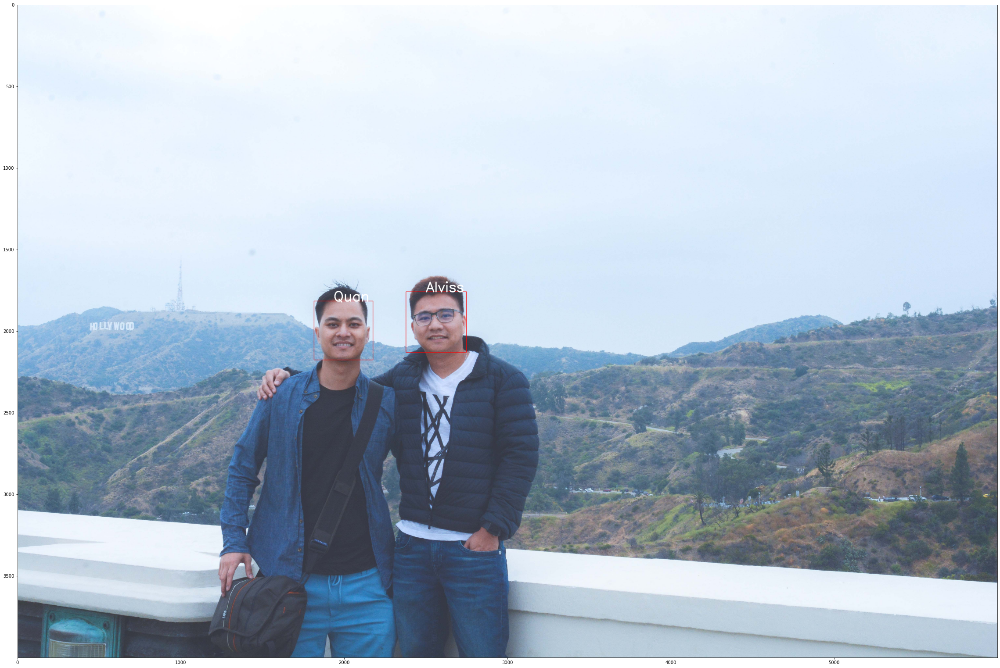

In [27]:
image1 = detect_faces_in_img('img/DSC_6366.jpg')  
plt.figure(figsize=(40,40))
plt.imshow(image1)

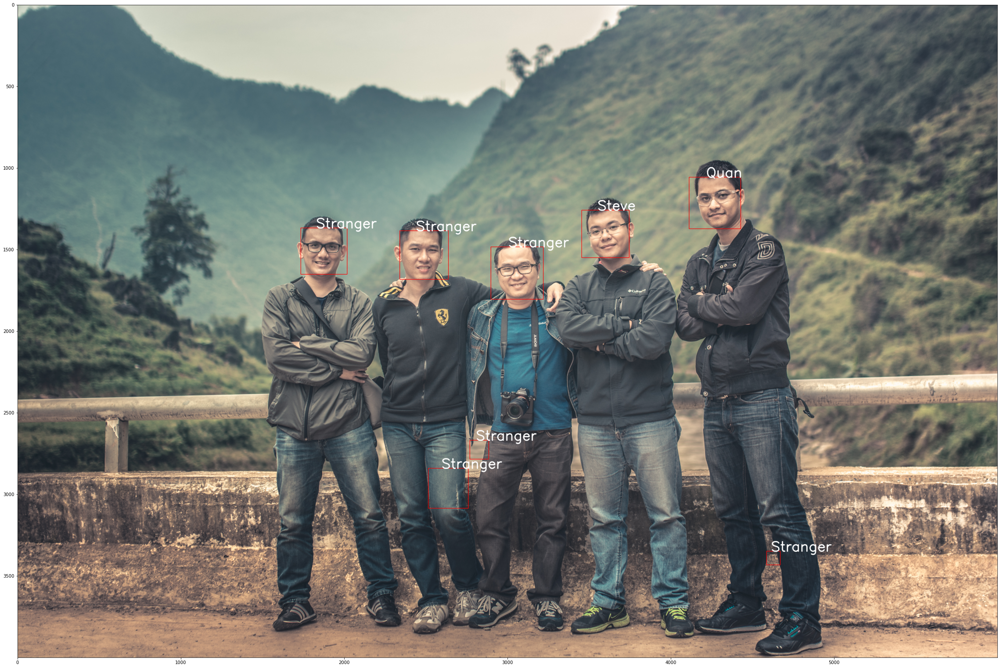

In [30]:
image2 = detect_faces_in_img('img/DSC_4816.jpg')  
plt.figure(figsize=(40,40))
plt.imshow(image2)

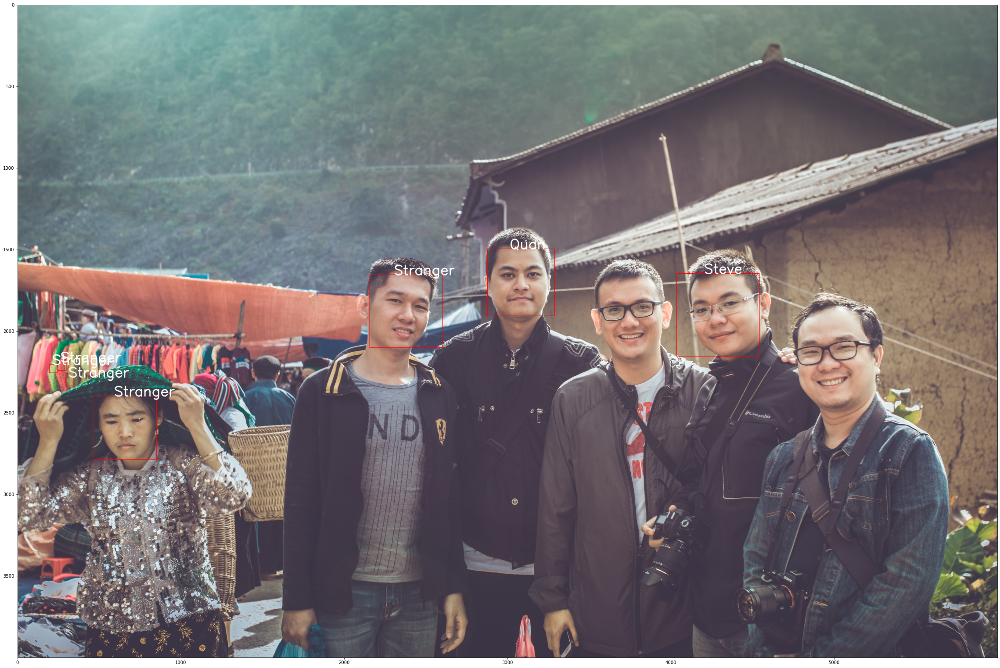

In [32]:
image2 = detect_faces_in_img('img/DSC_4922.jpg')  
plt.figure(figsize=(40,40))
plt.imshow(image2)

It worked perfectly!
Last but not least, the Trump face samples are used for a Trump-face-detection in a video. To achieve it is simply applying the same algorithm above to every single frame of an input video. The result is recorded as below.

In [36]:
from IPython.display import HTML

# Youtube
HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/MfZ9L-_Xe78?rel=0&amp;controls=0&amp;showinfo=0" frameborder="0" allowfullscreen></iframe>')

### 6: Conclusion
The goal of the project is achieved, though the below elements need to be improved:</br>
1. The search_for_face algorithm is not 100% correct since it will return the first matched face, which sometimes result in incorrect face identification result. 
2. The search_for_face algorithm is really slow since it needs to compare input face with almost all the faces in the database in the worst case scenario